
# Pangu Weather

## Introduction

Pangu-Weather is a global weather forecast system. It uses a deep learning approach, 
with a data-driven environment. 
It uses 43 years of hourly global weather from the 5th generation of ECMWF reanalysis (ERA5) data and train a few deep neural networks with about 256 million parameters in total.
Spatial resolution  of forecast is  0.25ºx0.25º comparable to the ECMWF Integrated Forecast Systems (IFS).
Result that they claim: this method outperforms state-of-the-art numerical weather prediction (NWP) methods in terms of accuracy (latitude-weighted RMSE and ACC) for all variables and in short to medium time ranges (from one hour to one week). 

### Strategies (remove this section?): 

(i) designing a 3D Earth Specific Transformer (3DEST) architecture that formulates the height (pressure level) information into cubic data, 

(ii) applying a hierarchical temporal aggregation algorithm to alleviate cumulative forecast errors. 


###### (from the ArXiv abstract)
References:  

[ArXiv](https://arxiv.org/abs/2211.02556) 
[Github](https://github.com/198808xc/Pangu-Weather)


## How to run the code

Premise: the models are stored using the ONNX format, and thus can be used via different languages such as Python, C++, C#, Java, etc.
I’m using Python with Anaconda

1)Clone the repository


The ```README``` file contains all the information on how to run the code
Create a conda environment 

<div class="alert alert-block alert-info">
<b>Note: </b>python version above 3.10 can cause conflicts with the packages listed in requirements_cpu.txt
</div>

<div class="alert alert-block alert-warning">
Note3
</div>

```conda install --file requirements.txt```

<div class="alert alert-block alert-warning">
causes compatibility problems
</div>

The downloaded files shall be organized as the following hierarchy:
```
├── root
│   ├── input_data
│   │   ├── input_surface.npy
│   │   ├── input_upper.npy
│   ├── output_data
│   ├── pangu_weather_1.onnx
│   ├── pangu_weather_3.onnx
│   ├── pangu_weather_6.onnx
│   ├── pangu_weather_24.onnx
│   ├── inference_cpu.py
│   ├── inference_gpu.py
│   ├── inference_iterative.py
```

git clone … download only the *py and *npy in directory
You need to download the *onnx files (trained methods) from Google drive
(let’s use gdown in order to download files from google drive)

```pip install gdown``` 

The 1-hour model (pangu_weather_1.onnx)

```gdown --fuzzy https://drive.google.com/uc?id=1fg5jkiN_5dHzKb-5H9Aw4MOmfILmeY-S```

The 3-hour model (pangu_weather_3.onnx)

```gdown --fuzzy https://drive.google.com/uc?id=1EdoLlAXqE9iZLt9Ej9i-JW9LTJ9Jtewt```

The 6-hour model (pangu_weather_6.onnx)

```gdown --fuzzy https://drive.google.com/uc?id=1a4XTktkZa5GCtjQxDJb_fNaqTAUiEJu4```

The 24-hour model

```gdown --fuzzy https://drive.google.com/uc?id=1lweQlxcn9fG0zKNW8ne1Khr9ehRTI6HP```


(```gdown```, if you use the gdrive link in the document, gives each time an error and suggest to use ```–fuzzy``` “link_above”)


## Input data preparation using Python


Input data (with initial conditions) are numpy array
There are two files that shall be put under the **input_data folder**, namely, ***input_surface.npy*** and ***input_upper.npy***.

***input_surface.npy*** stores the input surface variables. It is a numpy array shaped _(4,721,1440)_ where the first dimension represents the 4 surface variables : ***MSLP*** (Mean Sea Level Pressure), ***U10*** (zonal component of wind at 10 meters above the Earth's surface), ***V10*** (meridional component of wind at 10 meters above the Earth's surface), ***T2M*** (air temperature at 2 meters above the Earth's surface) in the exact order.

***input_upper.npy*** stores the upper-air variables. It is a numpy array shaped _(5,13,721,1440)_ where the first dimension represents the 5 surface variables: ***Z*** (geopotential height), ***Q*** (specific humidity), ***T*** (air temperature), ***U*** (zonal component of wind) and ***V*** (meridional component of wind) in the exact order, and the second dimension represents the 13 pressure levels: 1000hPa, 925hPa, 850hPa, 700hPa, 600hPa, 500hPa, 400hPa, 300hPa, 250hPa, 200hPa, 150hPa, 100hPa and 50hPa in the exact order.
In both cases, the dimensions of 721 and 1440 represent the size along the latitude and longitude, where the numerical range is [90,-90] degree and [0,359.75] degree, respectively, and the spacing is 0.25 degrees. For each 721x1440 slice, the data format is exactly the same as the .nc file downloaded from the ERA5 official website.


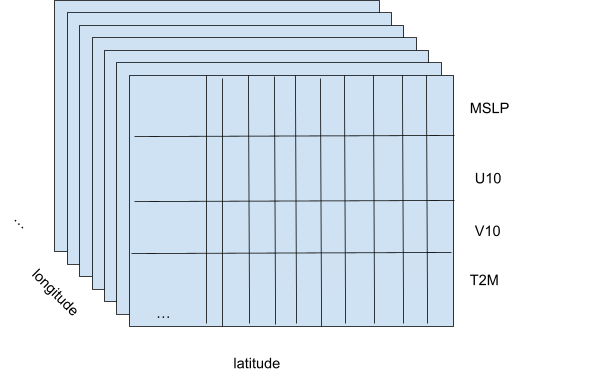

In [518]:
from IPython import display
display.Image("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_surface_npy.png")


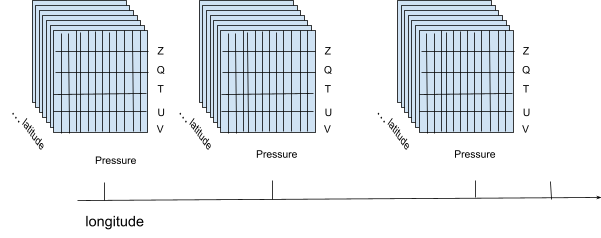

In [519]:
from IPython import display
display.Image("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_upper_npy.png")


Note that the numpy arrays should be in single precision (.astype(np.float32)), not in double precision.
We support ERA5 initial fields and ECMWF initial fields (e.g., the initial fields of the HRES forecast), where the latter often leads to a slight accuracy drop (mainly for T2M because the two fields are quite different in temperature). A .nc file of ERA5 can be transformed into a .npy file using the netCDF4 package, and a .grib file of the ECMWF initial fields can be transformed into a .npy file using the pygrib package. Note that Z represents geopotential, not geopotential height, so a factor of 9.80665 should be multiplied if the raw data contains the geopotential height.
We temporarily do not support other kinds of initial fields due to the possibly dramatic differences in the fields when Z<0.


An example of transferred input files, input_surface.npy and input_upper.npy, which correspond to the ERA5 initial fields of at 12:00UTC, 2018/09/27, can be downloaded from Google drive:
```
cd input_data/
gdown --fuzzy https://drive.google.com/uc?id=1pj8QEVNpC1FyJfUabDpV4oU3NpSe0BkD
gdown --fuzzy https://drive.google.com/uc?id=1--7xEBJt79E3oixizr8oFmK_haDE77SS
```

## How to run

For a 24-hour weather forecast on CPU with the 24-hour model run:
```
python inference_cpu.py 
```
Output files are:

```
output_data/output_upper.npy
output_data/output_surface.npy
```

Same shape as the corresponding input files:

```
Shape of  output_upper.npy
(5, 13, 721, 1440)
Shape of  output_surface.npy
(4, 721, 1440)
```

Further options 

```
python inference_gpu.py 
```

for gpu environment

```
python inference_iterative.py
```

shows an example to generate per-6-hour forecast within a week



## Pseudocode and how to use

pseudocode.py contains the pseudocode that elaborates our main algorithm. It is written in Python and can be implemented using any deep learning library, e.g. PyTorch and TensorFlow.
Note that one needs to download about 60TB of ERA5 data and prepare for computational resource of 3000 GPU-days (in V100) to train each model.


## To do list

- ~~fare testo barrato in notebook jupyter~~
- plot di riferimento
  - ~~viene?~~
  - ri centra la mappa
  - griglia
  - metti una scala dei colori decenti
- 
-   
- ~~comunica i risultati~~

- come si preparano i file di input per un giorno X? 
  - ~~Borrelli o Conti mi dicono dove trovare i file. Benassi mi ha dato le informazioni~~
- opzioni per i contorni, isolinee


- test a una settimana 
  - ~~vedi tutto quello scritto da chatgpt~~
  - misura il carico con top (ho usato pidstat)
  - salvare un file alla volta
- ~~caratteristiche server75~~
- continua con lo studio dell'articolo
  - finito?
  - metti le note nel notebook

- Git
  - Recupero file cancellato 
  - ~~Fork nei mio github~~


- ~~contour, no imshow~~
- ~~plot interattivo~~
- anaconda professional
- ~~fare liste in notebook jupyter~~
- ~~fare plot dei file di input per capire l'orientamento delle immagini~~
- ~~forecast ad una settimana~~
- forecast di durata arbitaria
- ~~run code with CPU with example input, o server75~~
- load (CPU, Ram, disk throughput)
- On a workstation?
- GPU?




# function for drawing surface plots

In [14]:
def plot_surface(file):

    import numpy as np
    %matplotlib inline 
    import matplotlib.pyplot as plt
    
    from matplotlib.colors import ListedColormap
    import matplotlib.colors as mcolors
    
    #data_in_surface = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_data/input_surface.npy")
    wd="/work3/zizzi/soclimpact_medcordex/Pangu-Weather/"
    #data = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/download_upper_27_09_2018.npy")
    data_surface = np.load(wd+file)
    
    plt.figure(figsize=(12, 10))
    #plt.imshow(data_in_surface[3, :, :])
    plt.imshow(data_surface[3, :, :], cmap="jet")

    #plt.colorbar()
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('K') 
    # Set appropriate axis labels and title
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    plt.title('T2M')

    # Display the plot
    plt.show()

    start_color = 'white'
    end_color = 'blue'

    # Define the number of colors in the gradient
    num_colors = 50


    # Create a color list with a gradient
    color_list = list(mcolors.LinearSegmentedColormap.from_list('ColorGradient', [start_color, end_color])(np.linspace(0, 1, num_colors)))

    # Plot a colorbar to visualize the color list
    #plt.imshow([np.arange(num_colors)], cmap=mcolors.ListedColormap(color_list))
    #plt.colorbar(ticks=range(num_colors), label='Gradient Colors')
    #plt.show()


    plt.figure(figsize=(12, 10))
    plt.imshow(data_surface[2, :, :], cmap=mcolors.ListedColormap(color_list))
    #plt.contourf(longitude, latitude, data_in_surface[2, :, :], levels=100, cmap='jet')

    plt.title('V10')
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('m/s') 
    plt.xlabel('longitude')
    plt.ylabel('latitude')


    plt.figure(figsize=(12, 10))
    plt.imshow(data_surface[1, :, :], cmap=mcolors.ListedColormap(color_list))
    #plt.contourf(longitude, latitude, data_in_surface[2, :, :], levels=100, cmap='jet')

    plt.title('U10')
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('m/s') 
    plt.xlabel('longitude')
    plt.ylabel('latitude')


    plt.figure(figsize=(12, 10))
    plt.imshow(data_surface[0, :, :], cmap='jet')
    #plt.contourf(longitude, latitude, data_in_surface[2, :, :], levels=100, cmap='jet')

    plt.title('MSLP')
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('Pa') 
    plt.xlabel('longitude')
    plt.ylabel('latitude')




# function for drawing upper (pressure levels) plots

In [30]:
def plot_upper(file, i):
    
    import numpy as np
    %matplotlib inline 
    import matplotlib.pyplot as plt
    
    
    wd="/work3/zizzi/soclimpact_medcordex/Pangu-Weather/"
    #data = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/download_upper_27_09_2018.npy")
    data_upper = np.load(wd+file)
    
    d_plev_label={1:"1000",2:'925',3:'850',4:'700',5:'600',6:'500',7:'400',8:'300',9:'250',10:'200',11:'150',12:'100',13:'50',}   
    
    #i identifies the pressure level. It is the second index of the numpy array
    #0:"1000",1:'925',2:'850',3:'700',4:'600',5:'500',6:'400',7:'300',8:'250',9:'200',10:'150',11:'100',12:'50',
    
    plev=i
    label=d_plev_label.get(plev+1)
    
    plt.figure(figsize=(12, 10))
    plt.title('Z@'+label+'hPa')
    plt.imshow(data_upper[0, plev, :, :]) #, cmap="winter")  #Z@1000hPa
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('m^2/s^2')  
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    
    plt.figure(figsize=(12, 10))
    plt.title('Q@'+label+'hPa')
    plt.imshow(data_upper[1, plev, :, :]) #, cmap="winter")  #Q@1000hPa
    
    cbar = plt.colorbar(shrink=0.485)
    cbar.set_label('kg/kg')
    plt.xlabel('longitude')
    plt.ylabel('latitude')

    plt.figure(figsize=(12, 10))
    plt.title('T@'+label+'hPa')
    plt.imshow(data_upper[2, plev, :, :], cmap="jet")  #T@1000hPa
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('K')
    plt.xlabel('longitude')
    plt.ylabel('latitude')

    plt.figure(figsize=(12, 10))
    plt.title('U@'+label+'hPa')
    plt.imshow(data_upper[3, plev, :, :], cmap="winter")  #U@1000hPa
    cbar = plt.colorbar(shrink=0.485) 
    cbar.set_label('m/s')
    plt.xlabel('longitude')
    plt.ylabel('latitude')

    plt.figure(figsize=(12, 10))
    plt.title('V@'+label+'hPa')
    plt.imshow(data_upper[4, plev, :, :], cmap="winter")  #V@1000hPa
    cbar = plt.colorbar(shrink=0.485)    
    cbar.set_label('m/s')  
    plt.xlabel('longitude')
    plt.ylabel('latitude')
    
    

## Tests

### Reference plot 

#### taken from the reference files

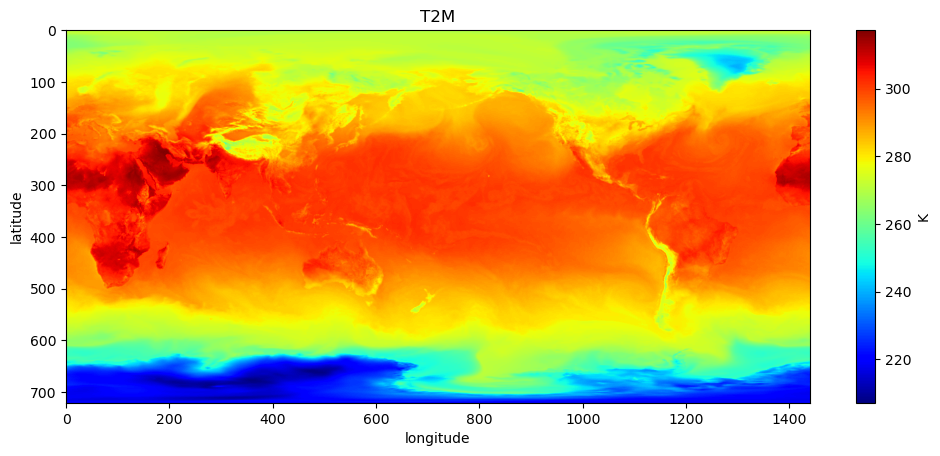

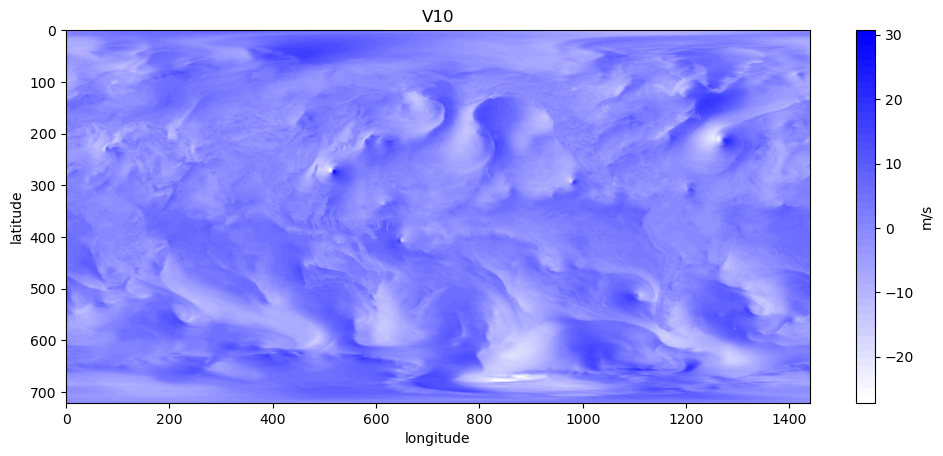

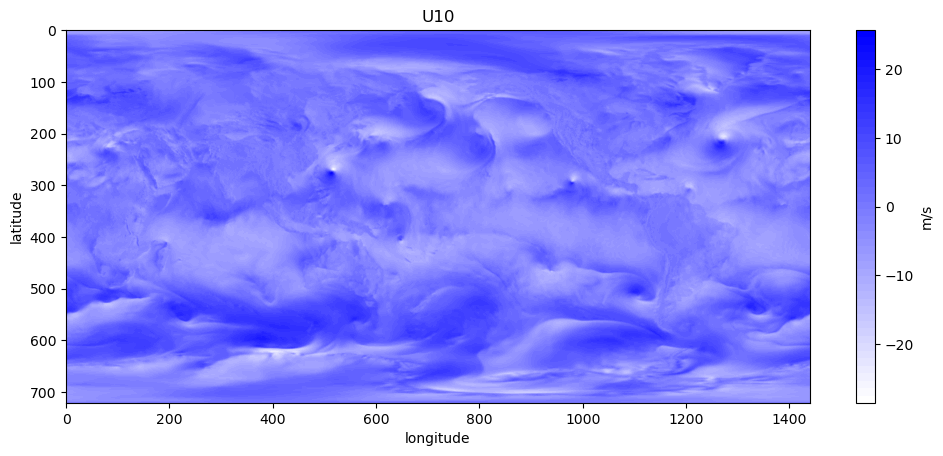

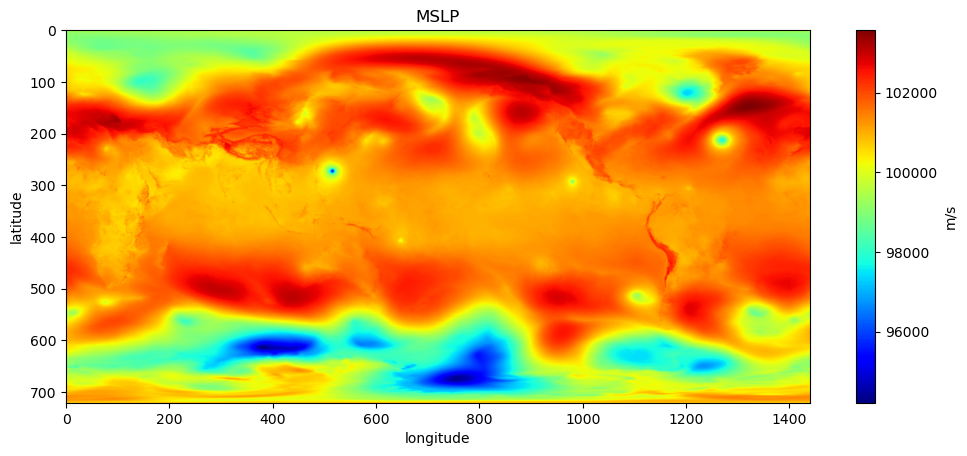

In [370]:
plot_surface("input_data/input_surface.npy")

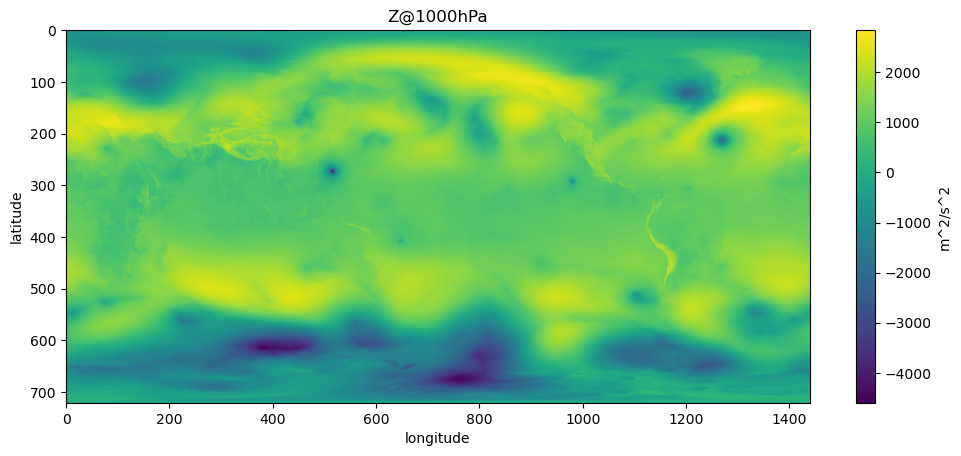

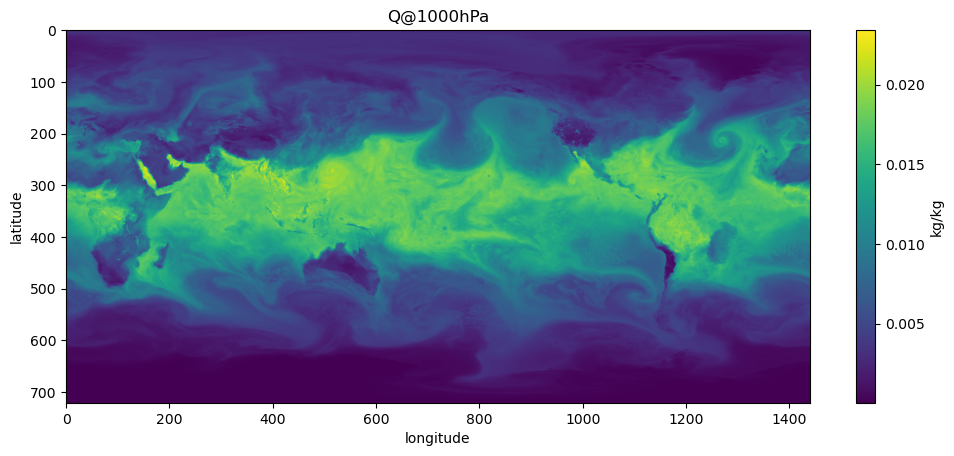

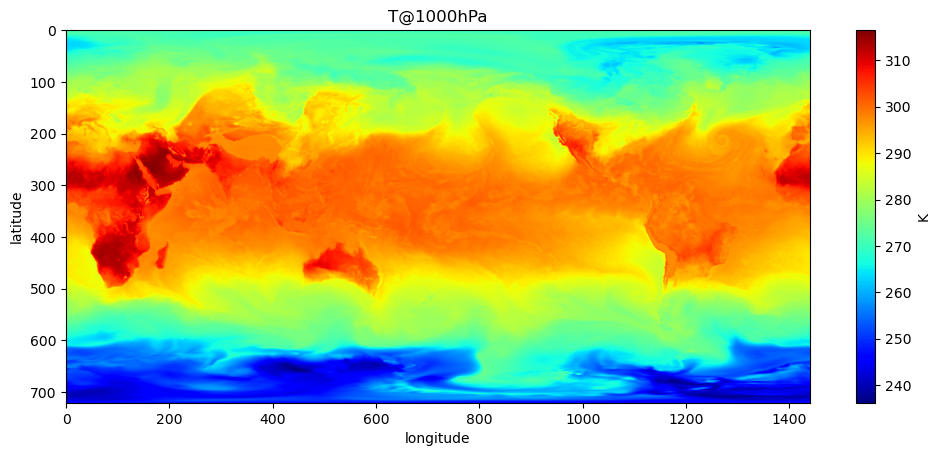

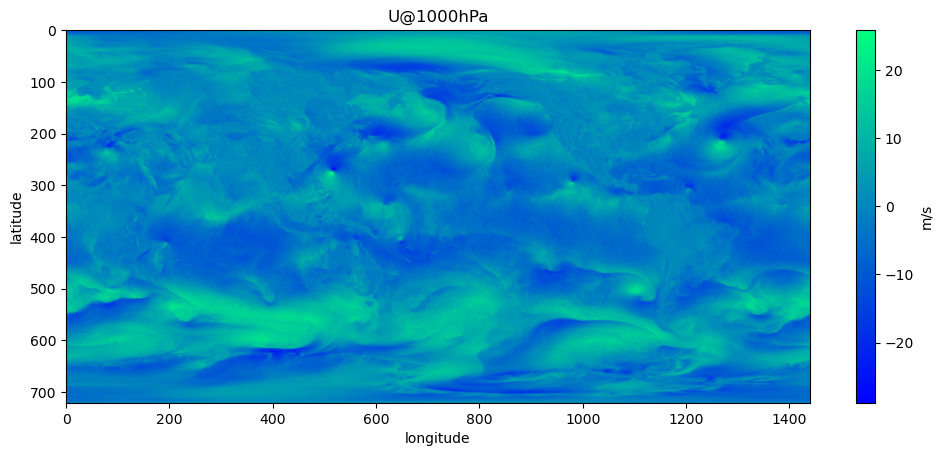

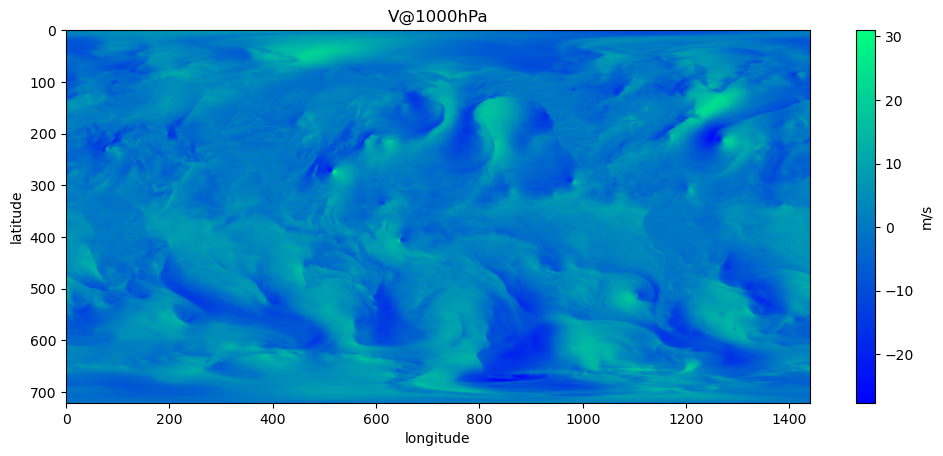

In [482]:
plot_upper("input_data/input_upper.npy",0)

# test plot

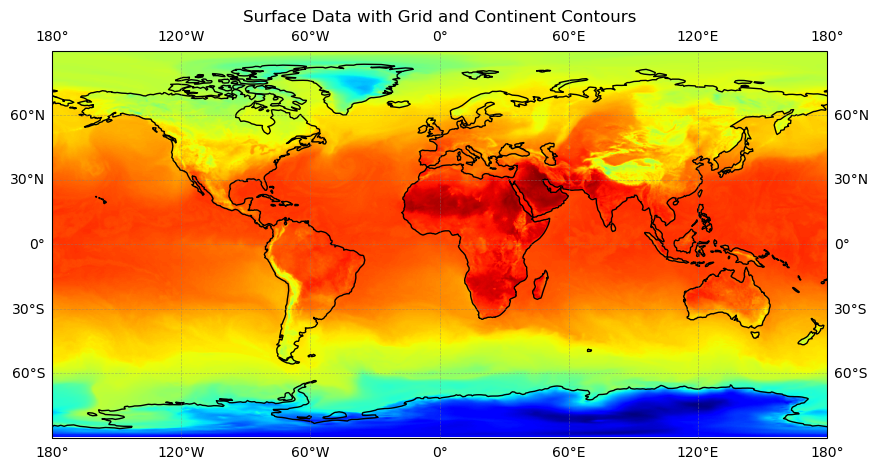

In [94]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Assuming `data` is your NumPy array with shape (4, 721, 1440)
data_in_surface = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_data/input_surface.npy")
data_in_upper = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_data/input_upper.npy")

# Extract the latitude and longitude values
latitudes = np.arange(-90, 90, 0.25)
longitudes = np.arange(0, 360, 0.25)

# Specify the desired latitude and longitude values for the grid
grid_latitudes = np.arange(-60, 61, 30)
grid_longitudes = np.arange(0, 241, 60)

# Create a figure and axes using Cartopy
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=0))

# Plot the data using imshow()
#0=MSLP , 1=U10, 2=V10, 3=T2M
ax.imshow(data_in_surface[3, :, :], origin='upper', extent=[0, 360, -90, 90], cmap='jet')

# Add gridlines and labels to the plot
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
#ax.set_xticks(grid_longitudes, crs=ccrs.PlateCarree())
#ax.set_yticks(grid_latitudes, crs=ccrs.PlateCarree())

# Add continent contours to the plot
ax.add_feature(cfeature.COASTLINE)

# Add continent contours to the plot
#ax.add_feature(cfeature.COASTLINE.with_scale('50m'), edgecolor='black')

# Add gridlines and labels to the plot
#ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--', xlocs=grid_longitudes, ylocs=grid_latitudes)


# Set appropriate axis labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Surface Data with Grid and Continent Contours')

# Display the plot
plt.show()




### HW info

Tests performed on:

2(CPU) x 16(cores) x 2(hyperthreading) = 32 physical cores / 64 logical cores

RAM=120GB

1 thread

### test 1 24-hour weather forecast

24-hour weather forecast on CPU with the 24-hour model with the inpunt file provided (12:00UTC, 2018/09/27) 

In order to run the test:
```
python inference_cpu.py 
```
Output files are:

```
output_data/forecast_24_output_upper.npy
output_data/forecast_24_output_surface.npy
```


Duration $\simeq$ 5 min

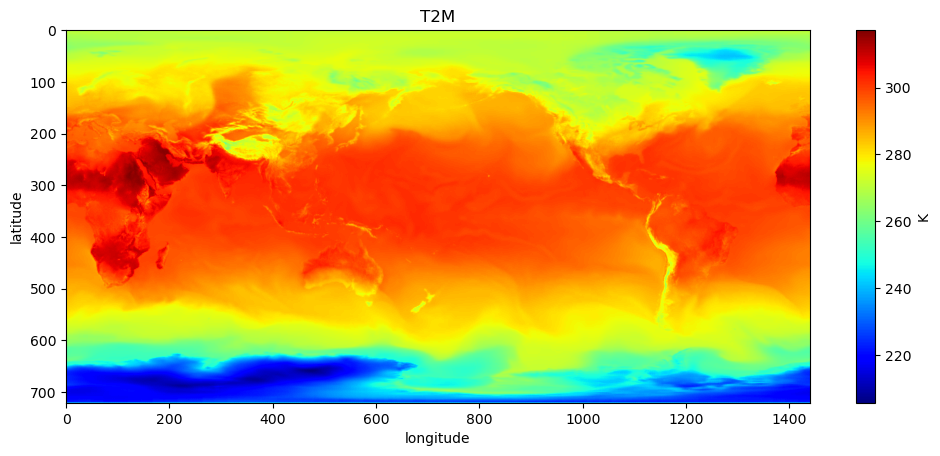

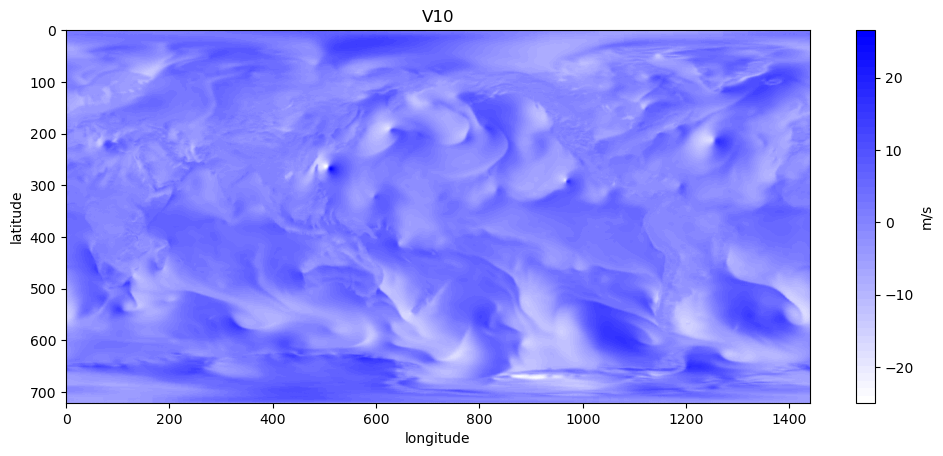

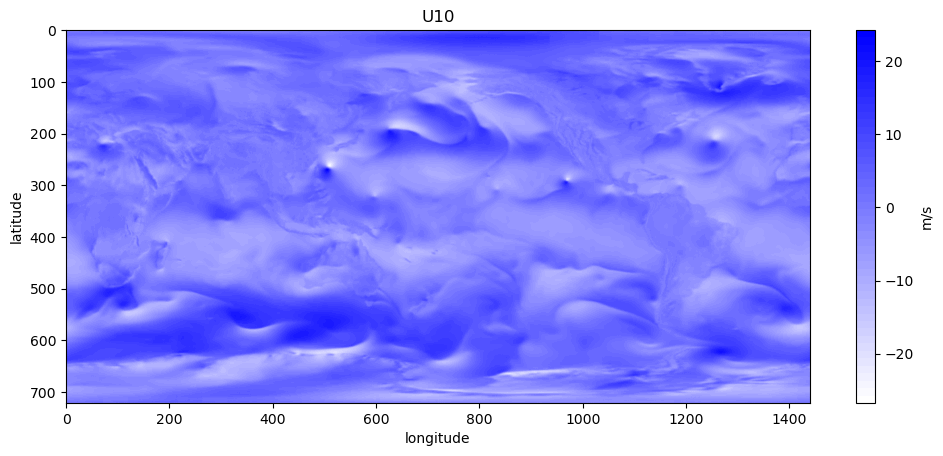

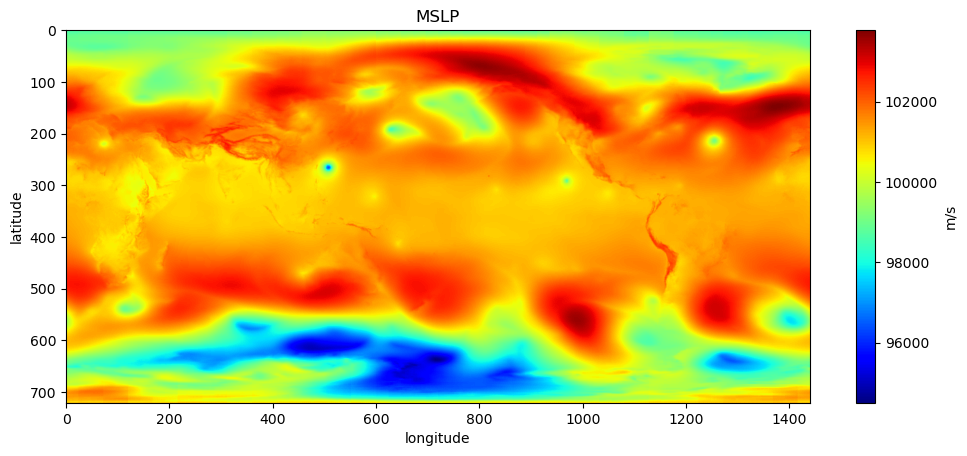

In [363]:
plot_surface("output_data/forecast_24_output_surface.npy")

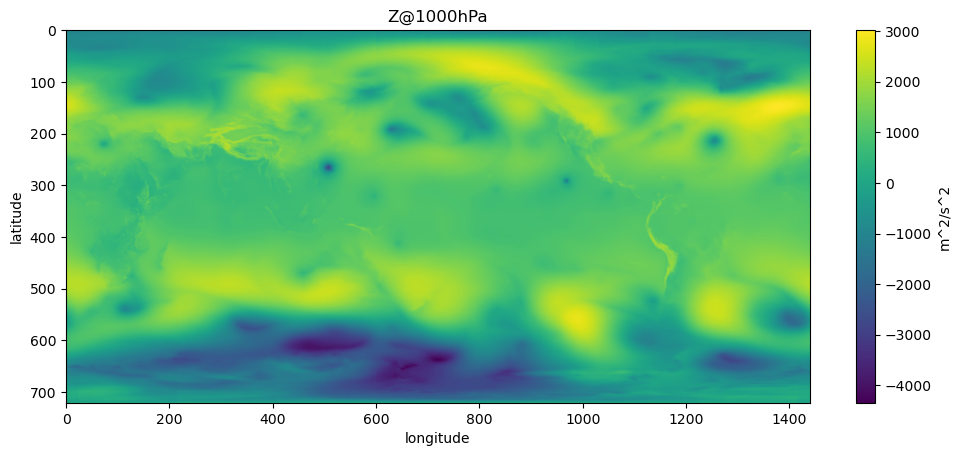

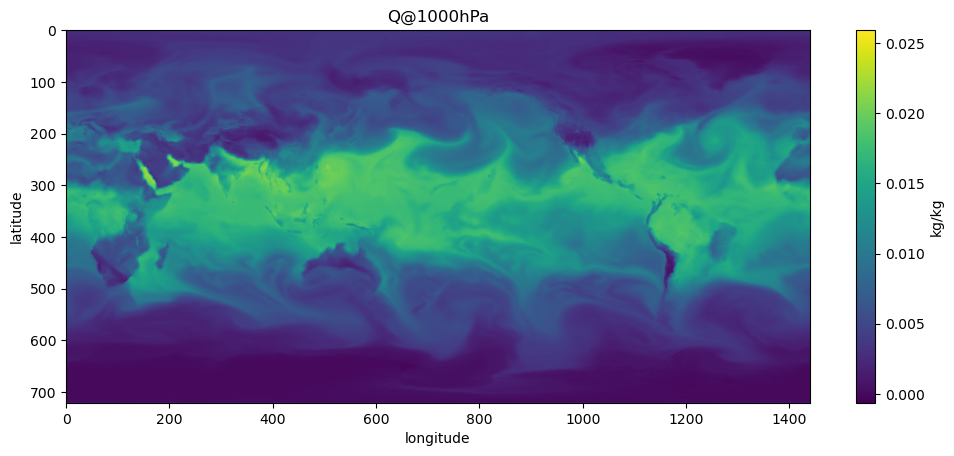

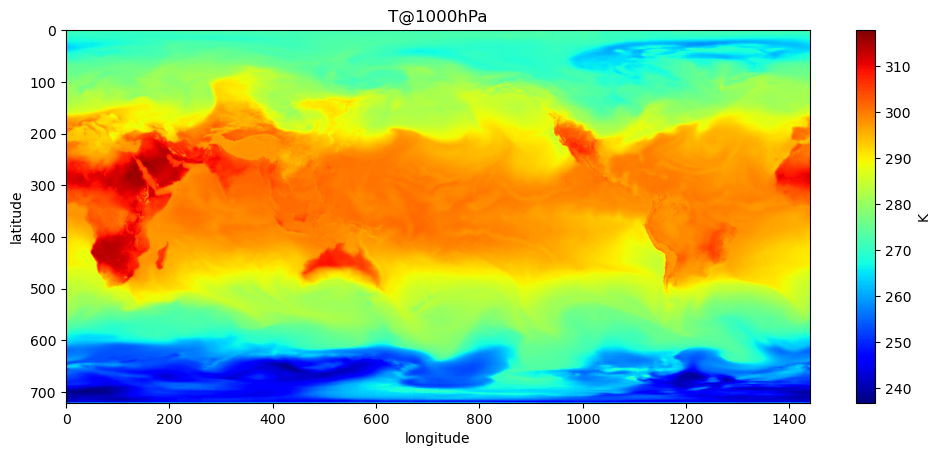

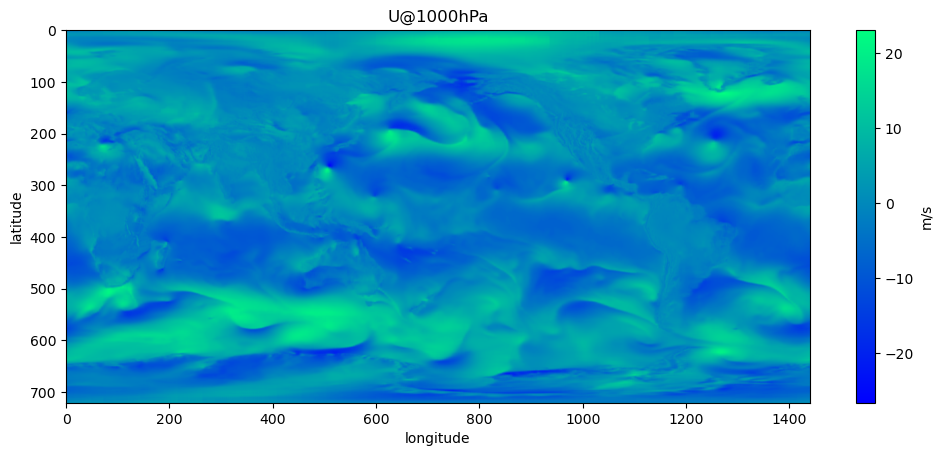

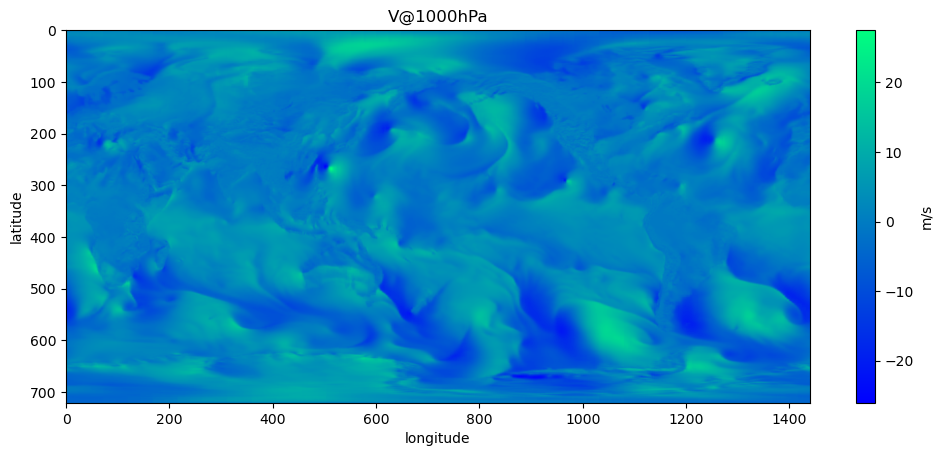

In [487]:
plot_upper("output_data/forecast_24_output_upper.npy",0)

### Test 1 weekly  forecast  (one file/6 h)

input file provided by the Pangu-Weather gorup (24-hour weather forecas)

Duration $\simeq$ 75min


(pangu) zizzi@server75:/work3/zizzi/soclimpact_medcordex/Pangu-Weather$ time python my_inference_iterative.py                          
Traceback (most recent call last):
  File "/work3/zizzi/soclimpact_medcordex/Pangu-Weather/my_inference_iterative.py", line 29, in <module>                               
    ort_session_24 = ort.InferenceSession('pangu_weather_24.onnx', sess_options=options, providers=[('CUDAExecutionProvider', cuda_provider_options)])
NameError: name 'cuda_provider_options' is not defined

real    0m1.640s
user    0m1.048s
sys     0m3.998s

<div class="alert alert-block alert-warning">
Note: inference_iterative.py is missing the code to write the files to disk
</div>


### i2date

The output of the weekly forecast is a bunch of files (one every six hours) with 
an index i=1...28 to distinguish them.
The i2date function converts i into a date.


In [46]:
import pandas as pd
from datetime import datetime
from dateutil.relativedelta import relativedelta

#def i2date_old(i):
#   print("step "+str(i)+" = day: "+str((i*6)//24)+", h: "+str((i*6)%24))

def i2date(date0_string,i):
    d=(i*6)//24
    h=(i*6)%24
    date0=datetime.strptime(date0_string, '%d/%m/%Y %H:%M')
    datei=date0+relativedelta(days=d, hours=h)
    print("step "+str(i)+" =",datei, "UTC")

#for i in range(1,29): 
#    i2date("27/9/2018 12:00",i)

In [486]:
i2date("27/9/2018 12:00",11)

step 11 = 2018-09-30 06:00:00 UTC


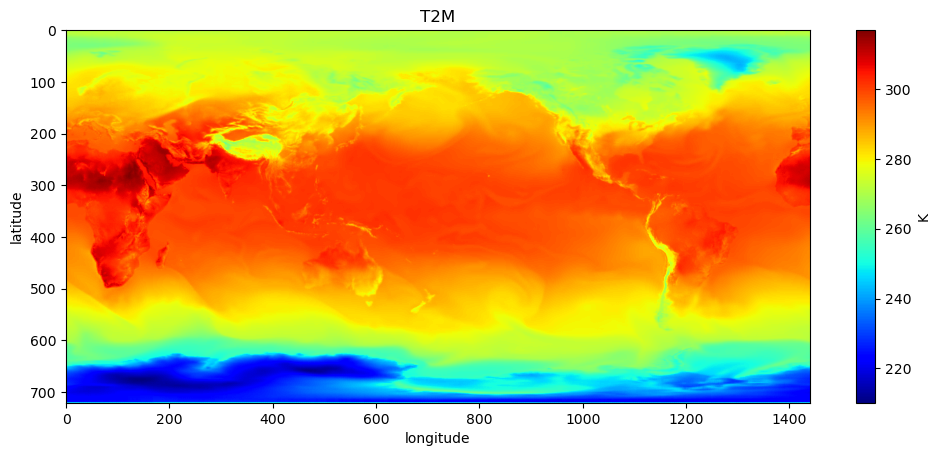

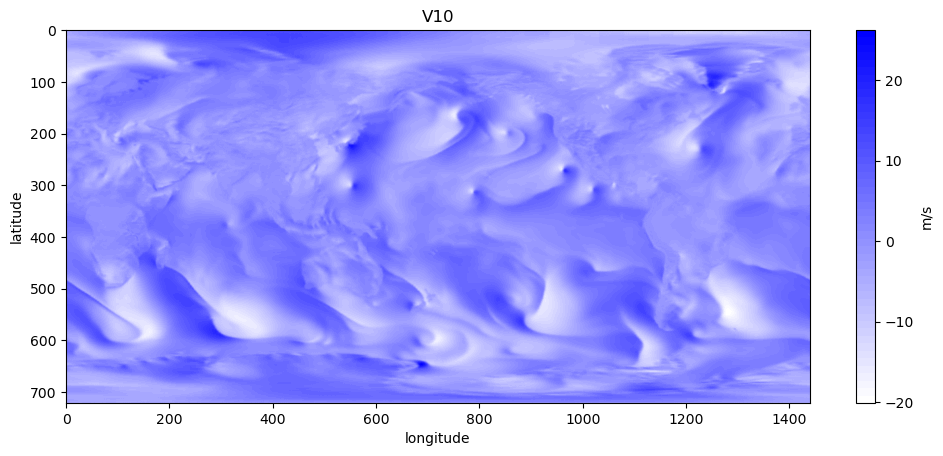

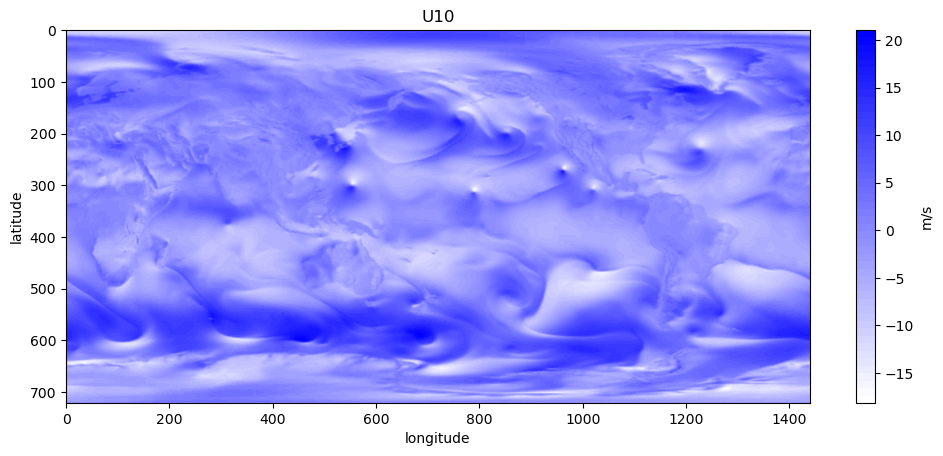

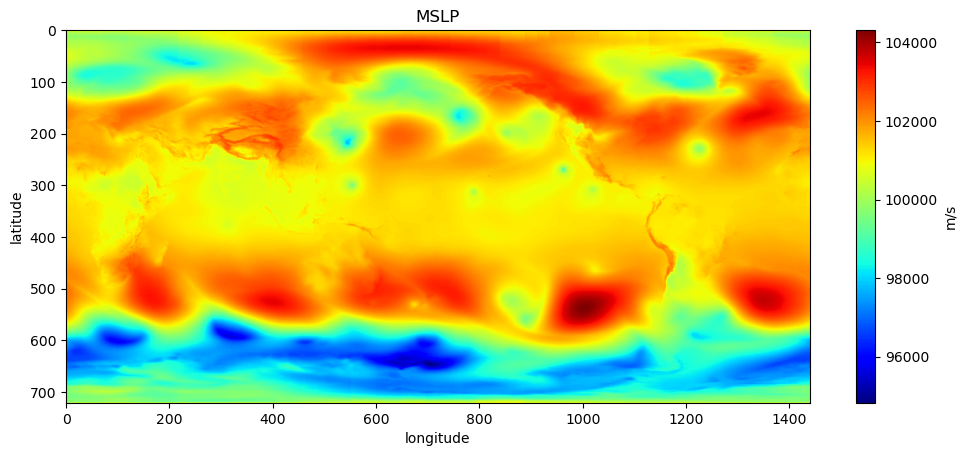

In [374]:
plot_surface("output_data/output_surface_step_11.npy")

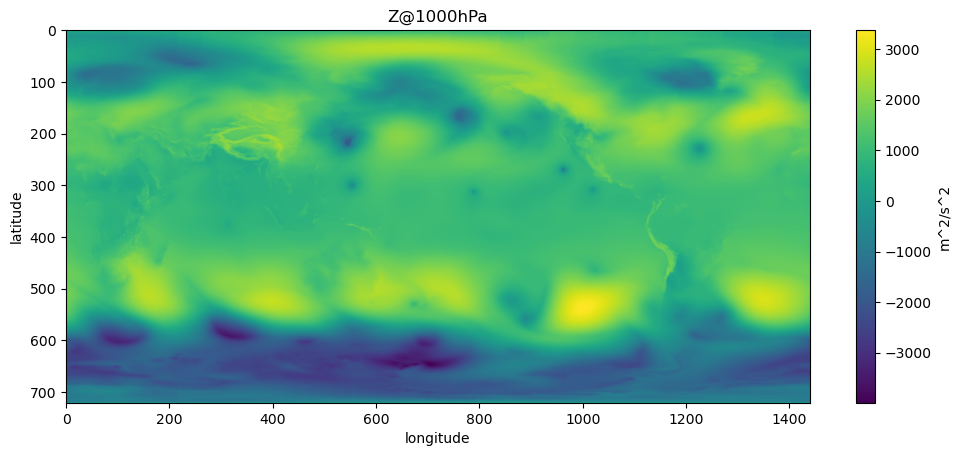

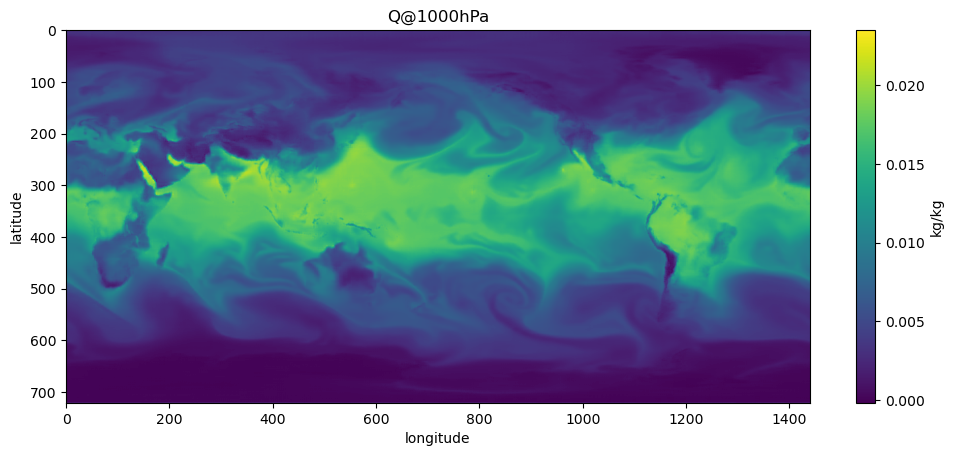

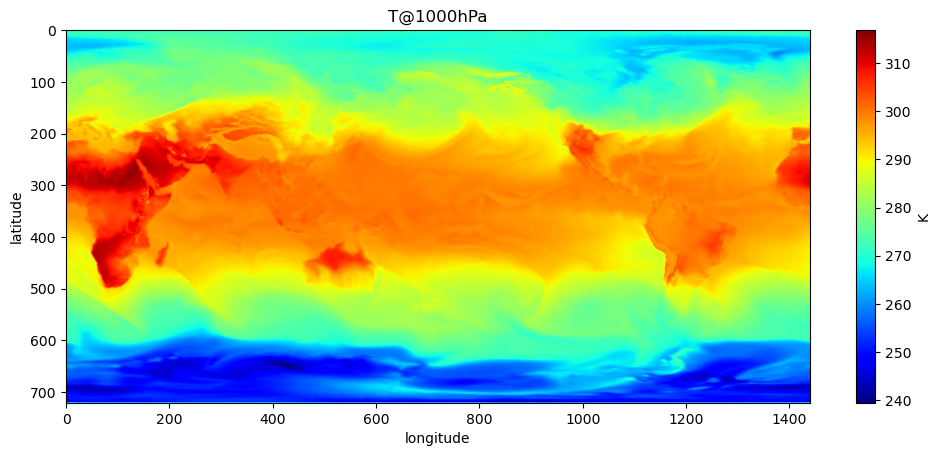

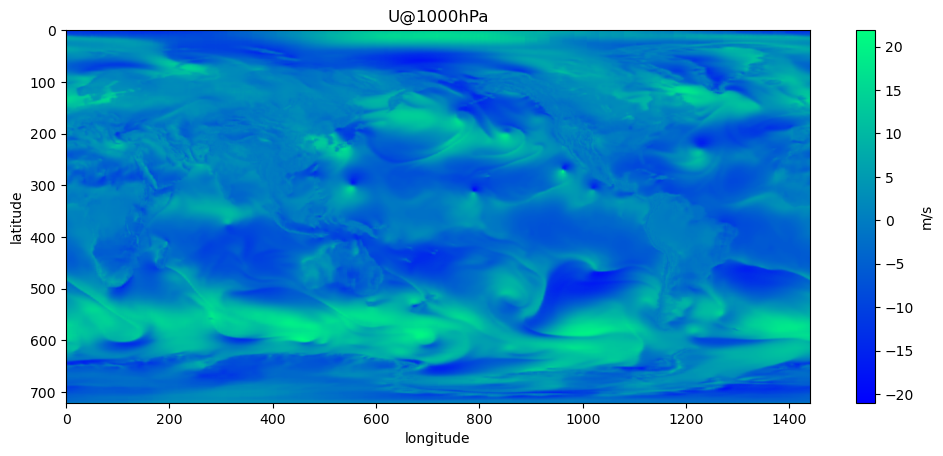

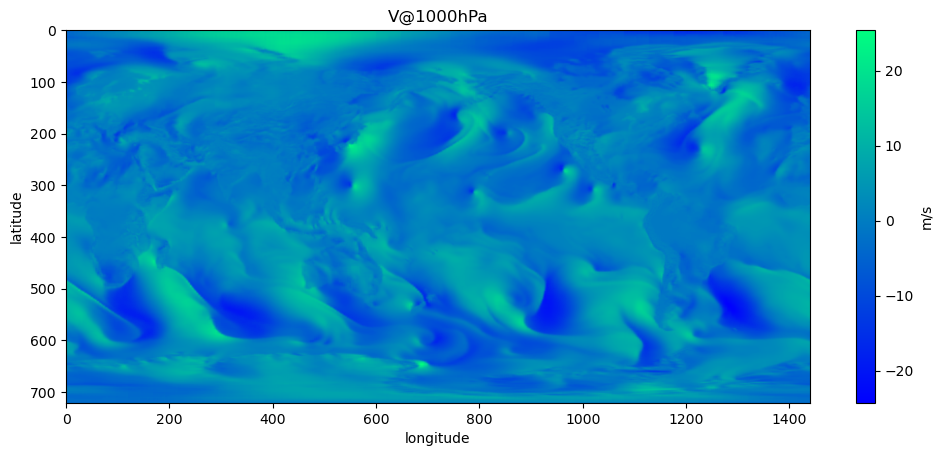

In [488]:
plot_upper("output_data/output_upper_step_11.npy",0)

## Dataset used for training


[ERA5 hourly data on single levels from 1940 to present](https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels?tab=overview)


[ERA5 hourly data on pressure levels from 1940 to present](https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-pressure-levels?tab=overview)


<div class="alert alert-block alert-info">
<b>Note: </b> In the future use "ERA5-Land hourly data from 1950 to present" dataset? 
    https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land?tab=overview
</div>

### How to download ECMWF files (with meaningful names) 

#### What to do in the local server 

####  how to download surface and upper files files

In [528]:
import cdsapi

def download_data(Iday,Imonth,Iyear,Itime,level):

	c = cdsapi.Client()

	if level =="surface":
		dict={  'product_type': 'reanalysis',
		        'variable': [
		            '10m_u_component_of_wind', '10m_v_component_of_wind', '2m_temperature',
		            'mean_sea_level_pressure',
		        ],
		        'year': Iyear,
		        'month': Imonth,
		        'day': Iday,
		        'time': Itime,
		        'format': 'grib',
		     }
		
		hour=dict['time'].split(':')[0]
		download="input_surface_"+dict['day']+"_"+dict['month']+"_"+dict['year']+"_"+hour+"."+dict['format']
		category='reanalysis-era5-single-levels' 
		#print(Itime)
		#print(download)

	if level=="upper":
		dict= {
		        'product_type': 'reanalysis',
		        'format': 'grib',
		        'pressure_level': [
		            '50', '100', '150',
		            '200', '250', '300',
		            '400', '500', '600',
		            '700', '850', '925',
		            '1000',
		        ],
		        'year': Iyear,
		        'month': Imonth,
		        'day': Iday,
		        'time': Itime,
		        'variable': [
		            'geopotential', 'specific_humidity', 'temperature',
		            'u_component_of_wind', 'v_component_of_wind',
		        ],
		    }
		    
		hour=dict['time'].split(':')[0]    
		download="input_upper_"+dict['day']+"_"+dict['month']+"_"+dict['year']+"_"+hour+"."+dict['format']
		category='reanalysis-era5-pressure-levels'
                
	print(download)
	print(category)

	c.retrieve(category, dict, download)

#if __name__ == "__main__":
#download_data("19","09","2018","12:00","upper")


In [532]:
download_data("16","09","2020","00:00","upper")

2023-09-18 19:31:48,107 INFO Welcome to the CDS
2023-09-18 19:31:48,107 INFO Sending request to https://cds.climate.copernicus.eu/api/v2/resources/reanalysis-era5-pressure-levels
2023-09-18 19:31:48,199 INFO Request is queued


input_upper_16_09_2020_00.grib
reanalysis-era5-pressure-levels


2023-09-18 19:31:49,208 INFO Request is running
2023-09-18 19:31:52,978 INFO Request is completed
2023-09-18 19:31:52,978 INFO Downloading https://download-0021.copernicus-climate.eu/cache-compute-0021/cache/data7/adaptor.mars.internal-1695058308.4725106-23154-2-56e05f3c-9a9d-4227-aef9-4236876d38ab.grib to input_upper_16_09_2020_00.grib (128.7M)
2023-09-18 19:31:55,882 INFO Download rate 44.3M/s 


### convert surface grib files into numpy arrays (grib_surf2numpy.py)

In [8]:
#surface grib files into numpy arrays

import pygrib
import numpy as np
from numpy import *

i_Time="16_09_2020_00"

# Open the GRIB file
grbs = pygrib.open(f'/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_surface_{i_Time}.grib')

# Choose a specific field/message from the GRIB file

U10_message = grbs[1]
print(U10_message)

V10_message = grbs[2]
print(V10_message)

T2M_message = grbs[3]
print(T2M_message)

MSLP_message = grbs[4]
print(MSLP_message)
#MSLP_data = MSLP_message.values.astype(np.float32)
#print(MSLP_data)

#does not work...(to do)
#for grb in grbs[:4]:
#    print(grb)

# Extract the data as a NumPy array
U10_data = U10_message.values

V10_data = V10_message.values

T2M_data = T2M_message.values

MSLP_data = MSLP_message.values

#a = np.zeros(shape=(4, 721, 1440))
#a = np.copy(U10_data) 

surface=stack((MSLP_data.astype(np.float32), U10_data.astype(np.float32), V10_data.astype(np.float32), T2M_data.astype(np.float32)) , axis=0)
#surface=stack((MSLP_data, U10_data, V10_data, T2M_data) , axis=0)

#print(surface.shape)
#print(surface)

# Close the GRIB file
grbs.close()

# Save the NumPy array as a .npy file
np.save(f'/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_surface_{i_Time}.npy', surface)

1:10 metre U wind component:m s**-1 (instant):regular_ll:surface:level 0:fcst time 0 hrs:from 202009160000
2:10 metre V wind component:m s**-1 (instant):regular_ll:surface:level 0:fcst time 0 hrs:from 202009160000
3:2 metre temperature:K (instant):regular_ll:surface:level 0:fcst time 0 hrs:from 202009160000
4:Mean sea level pressure:Pa (instant):regular_ll:surface:level 0:fcst time 0 hrs:from 202009160000


### convert grib pressure level files into numpy array  (grib_upper2numpy.py)


In [9]:
#grib pressure level files into numpy array

import pygrib
import numpy as np
from numpy import *

i_Time="16_09_2020_00"

# Create an empty list to store the 3D NumPy arrays
array_list = []

array_shape = (5, 721, 1440)  

# Number of arrays you want to create
num_arrays = 14  

# Create and append 3D NumPy arrays to the list with indexed names
for i in range(num_arrays):
    # Create a sample 3D NumPy array (replace this with your own data)
    arr = np.empty(array_shape, dtype=float32)  # Replace with your own array creation logic
    # Append the NumPy array to the list with a name that includes the index 'i'
    array_list.append(arr)


# Open the GRIB file
grbs = pygrib.open(f'/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_upper_{i_Time}.grib')

#d_var and d_plev dictionaries not used
#d_var={1:'Z_' ,2:'Q_', 3:'T_',4:'U_',5:'V_'}
#d_plev={1:"1000",2:'925',3:'850',4:'700',5:'600',6:'500',7:'400',8:'300',9:'250',10:'200',11:'150',12:'100',13:'50',}    
d_cost={1:60,2:55,3:50,4:45,5:40,6:35,7:30,8:25,9:20,10:15,11:10,12:5,13:0} 


for i, arr in enumerate(array_list[1:], start=1):   # loop in [1-14[ 
    
    Z_data=0;Q_data=0;T_data=0;U_data=0;V_data=0;
    
    for j in range(1,6):
       I=d_cost.get(i)+j
       if j == 1:
          Z_data = grbs[I].values
          #print("Z mess:", grbs[I])
       if j == 2:
          Q_data = grbs[I].values
          #print("Q mess:", grbs[I])
       if j == 3:
          T_data = grbs[I].values
          #print("T mess:", grbs[I])
       if j == 4:
          U_data = grbs[I].values
          #print("U mess:", grbs[I])
       if j == 5:
          V_data = grbs[I].values
          #print("V mess:", grbs[I])
#    print("----------------------------------------------")

    array_list[i] = stack((Z_data, Q_data, T_data, U_data, V_data), axis=0)    
  

stacked_array = np.stack([array_list[i] for i in range(1, 14)], axis=1)    
#print(stacked_array)    
#stacked_array_without_masked = stacked_array.filled(np.nan)
# Close the GRIB file
grbs.close()

unmasked_array = stacked_array.data

# Save the NumPy array as a .npy file

np.save(f'/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_upper_{i_Time}.npy', unmasked_array)

### tool di google  per comparare le skill dei modelli AI con i weather forecast dell'ECMWF:

https://sites.research.google/weatherbench/

## Test medicane Ianos 15- 20 September 2020

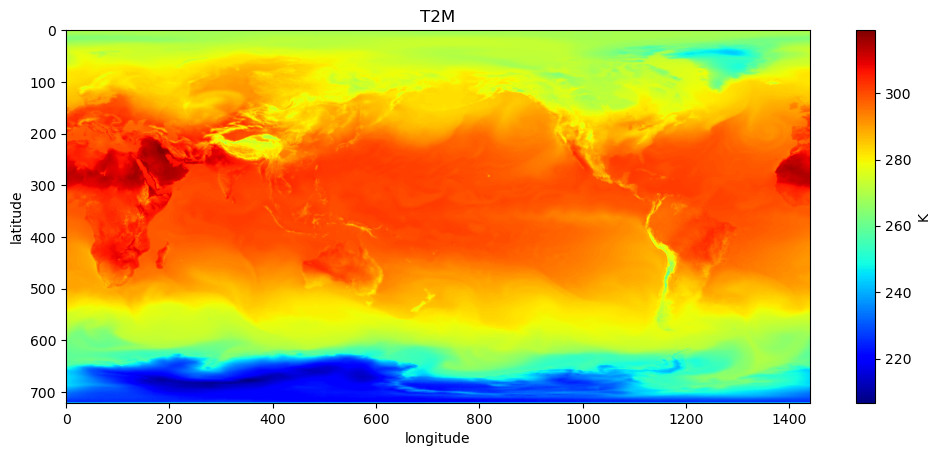

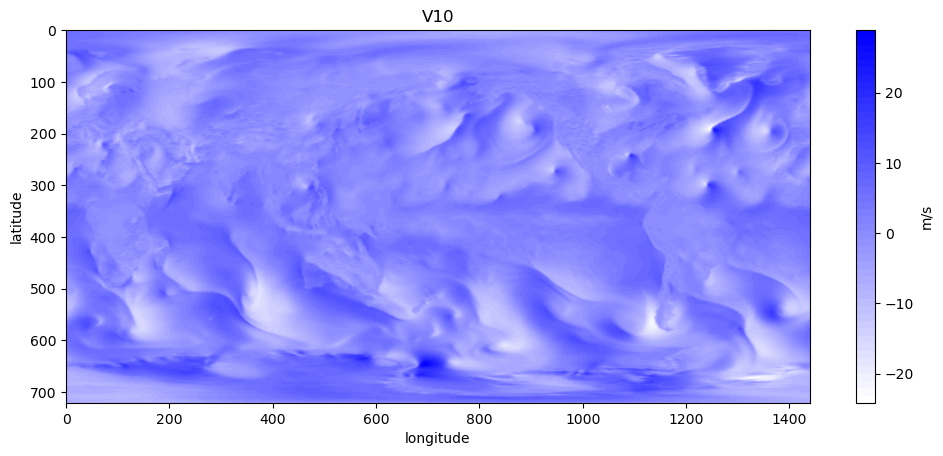

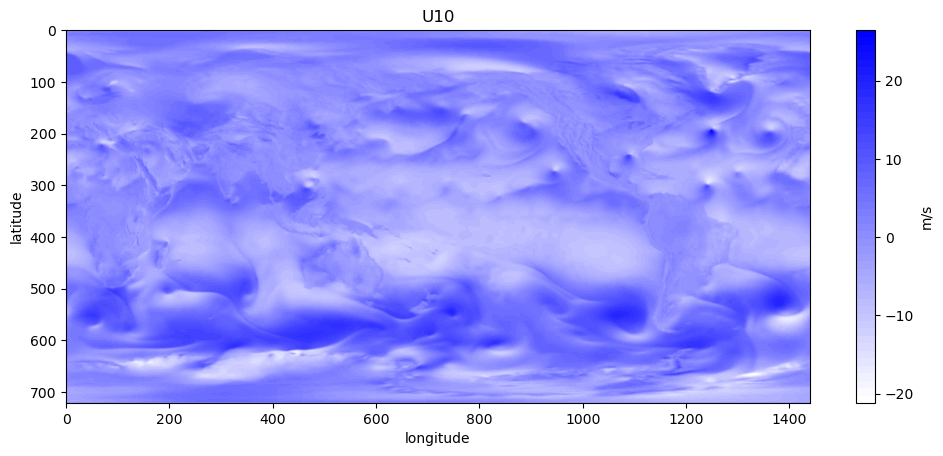

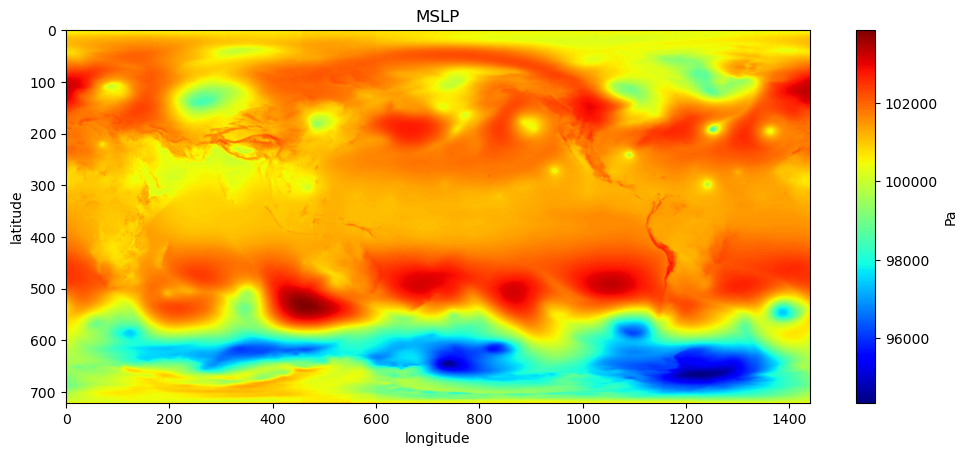

In [524]:
plot_surface("output_data/output_surface_15_09_2020_12.npy")

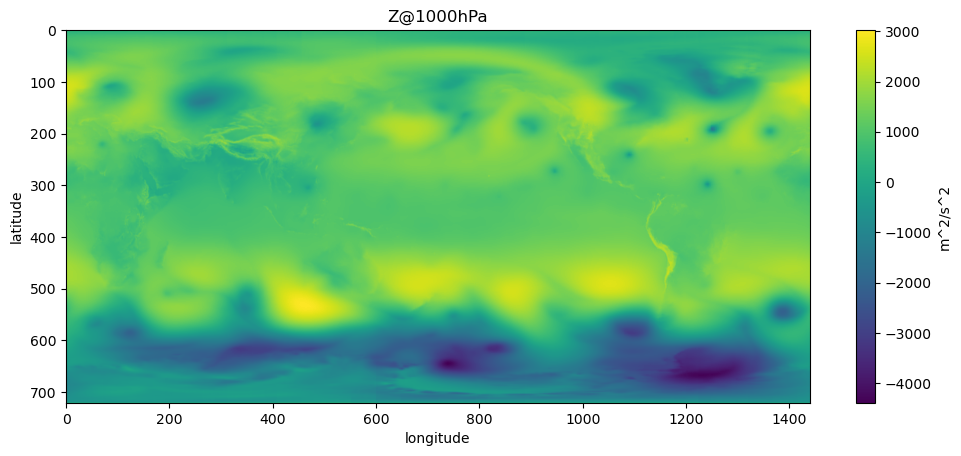

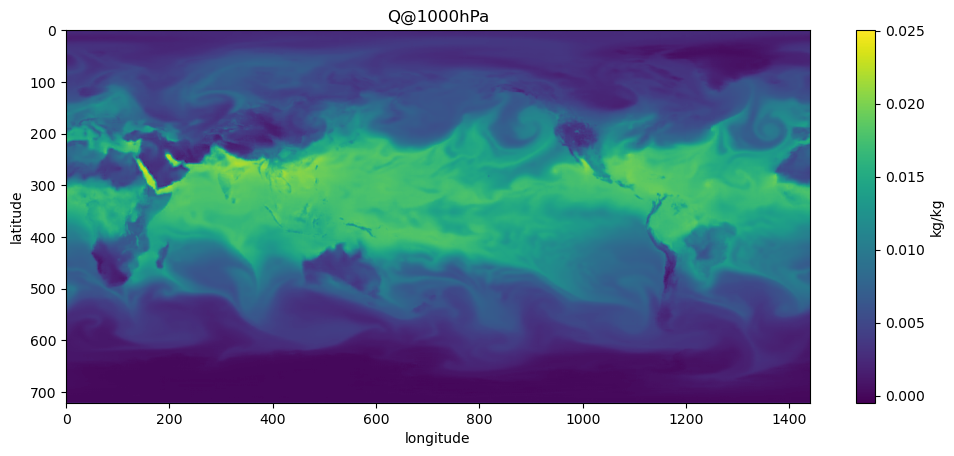

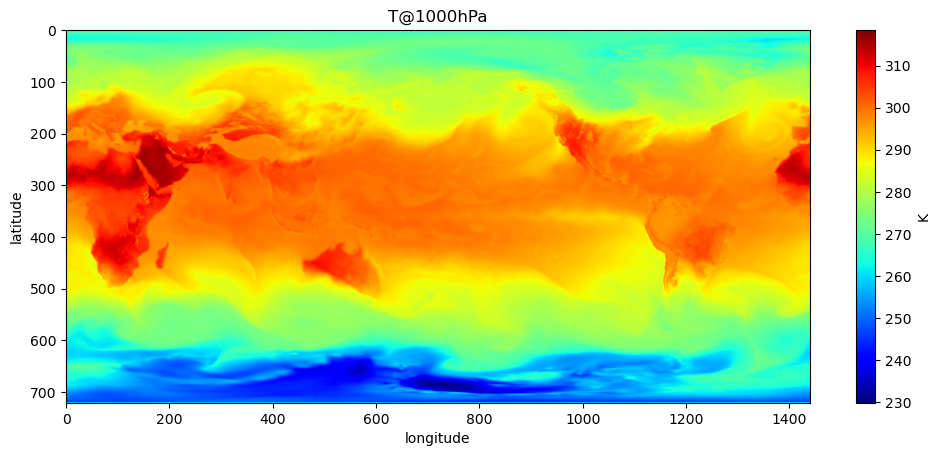

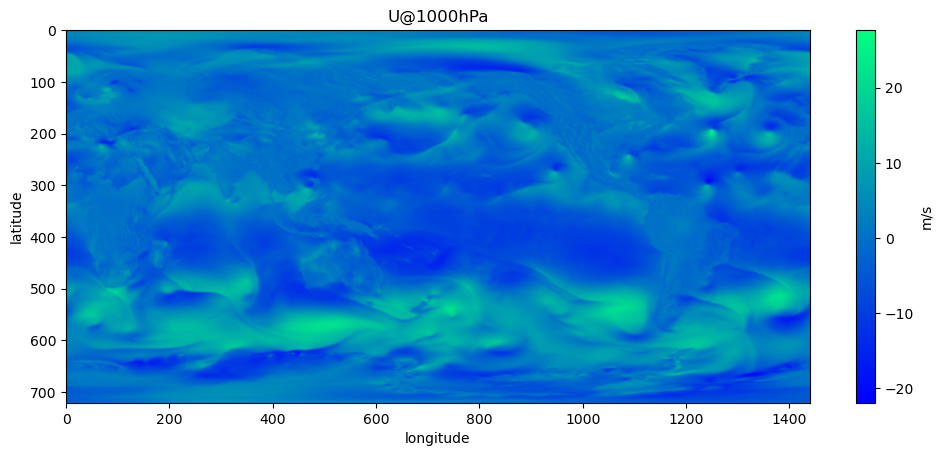

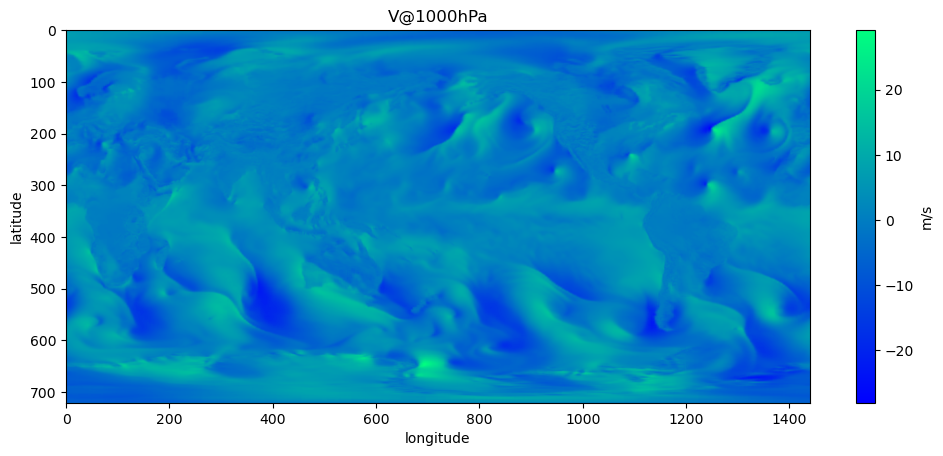

In [44]:
plot_upper("output_data/output_upper_15_09_2020_12.npy",0)

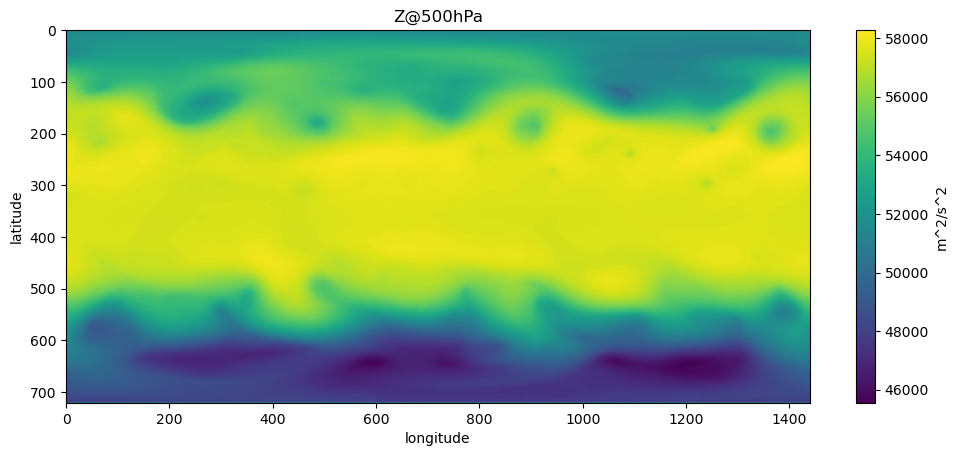

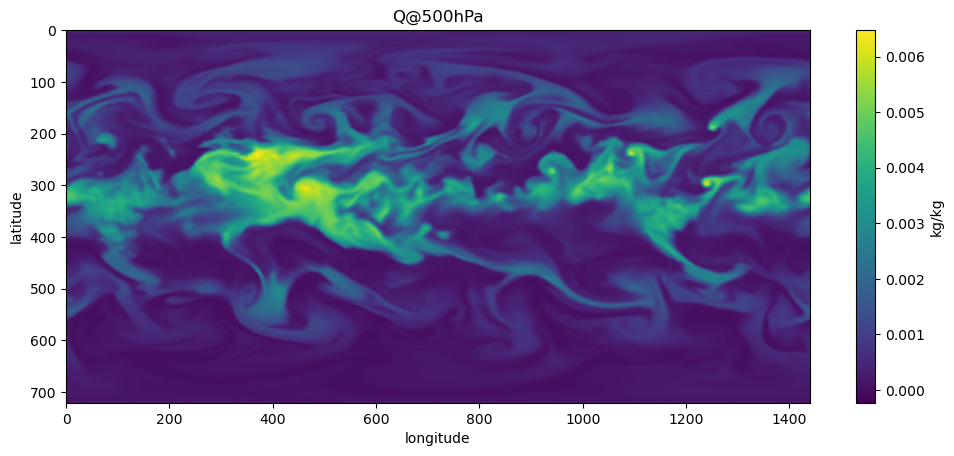

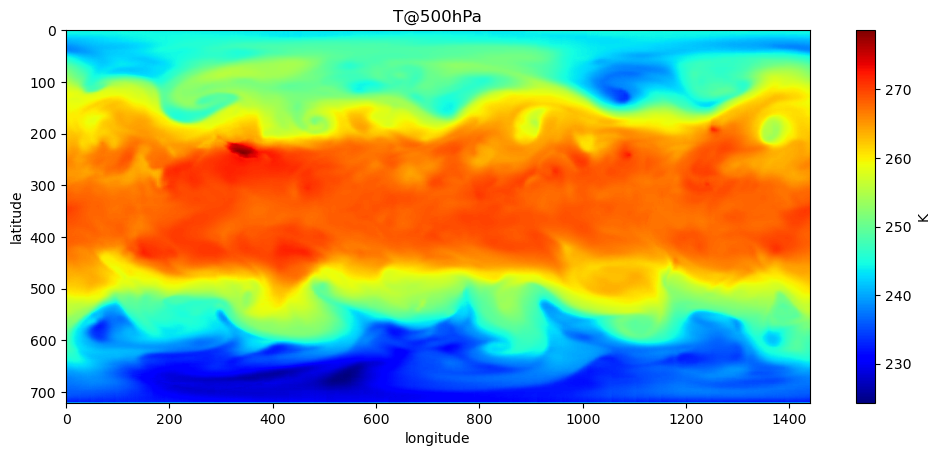

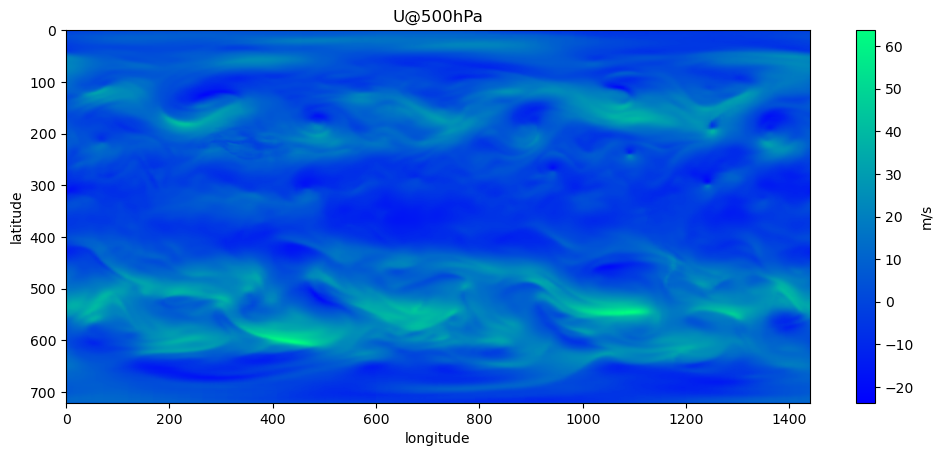

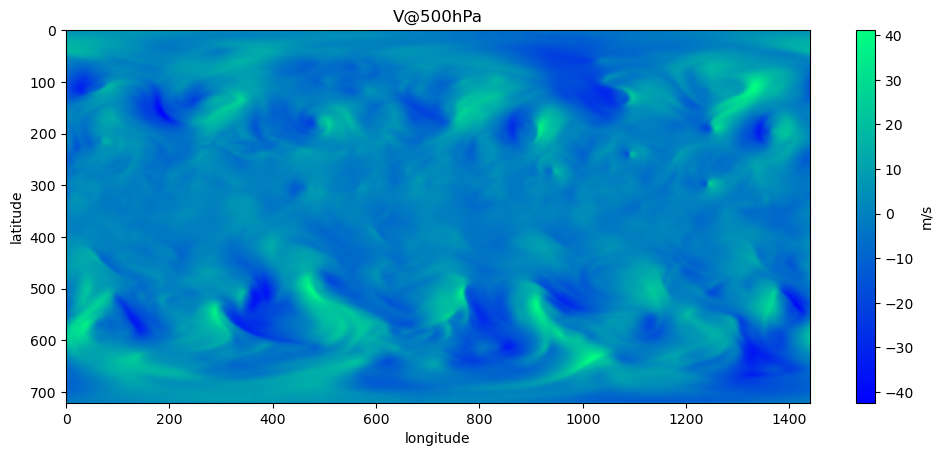

In [526]:
plot_upper("output_data/output_upper_15_09_2020_12.npy",5)

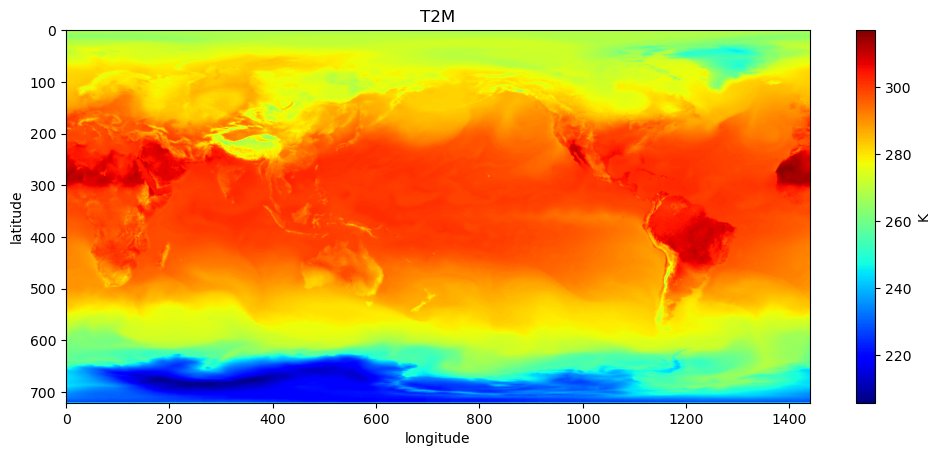

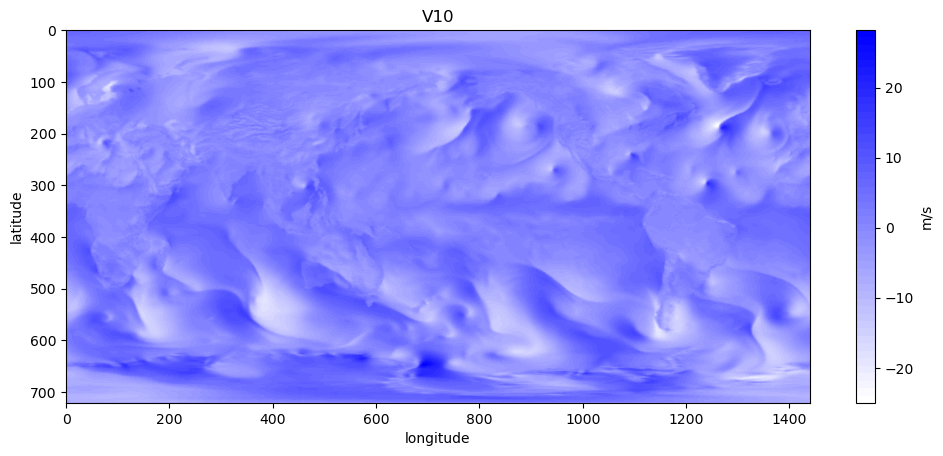

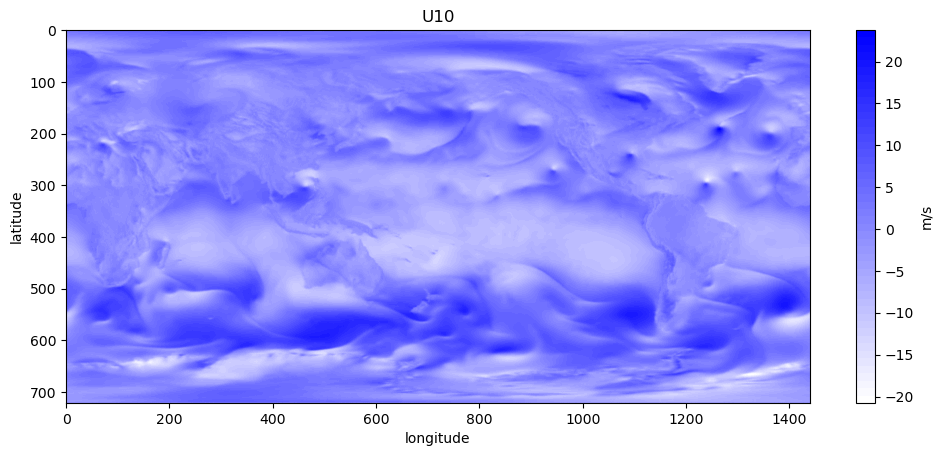

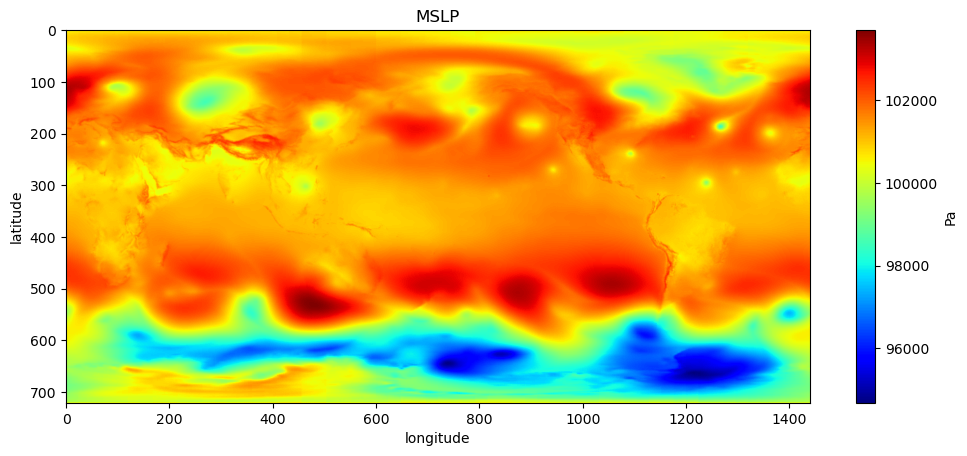

In [41]:
plot_surface("output_data/output_surface_15_09_2020_18.npy")

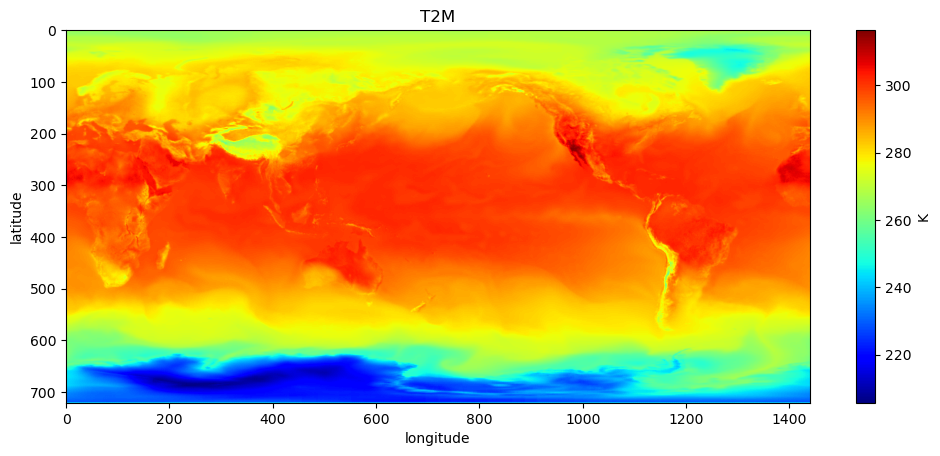

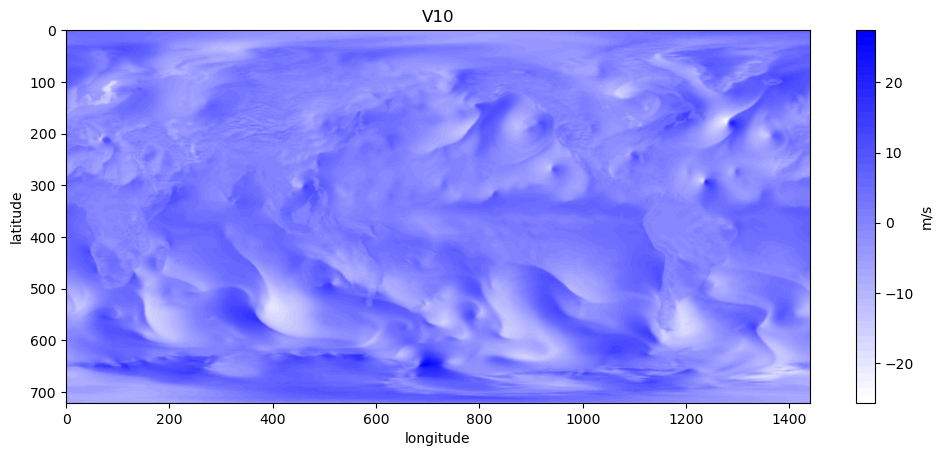

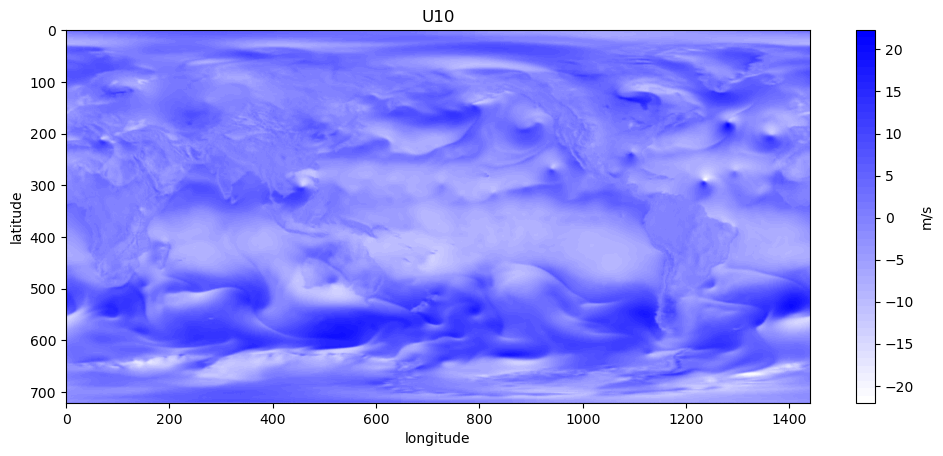

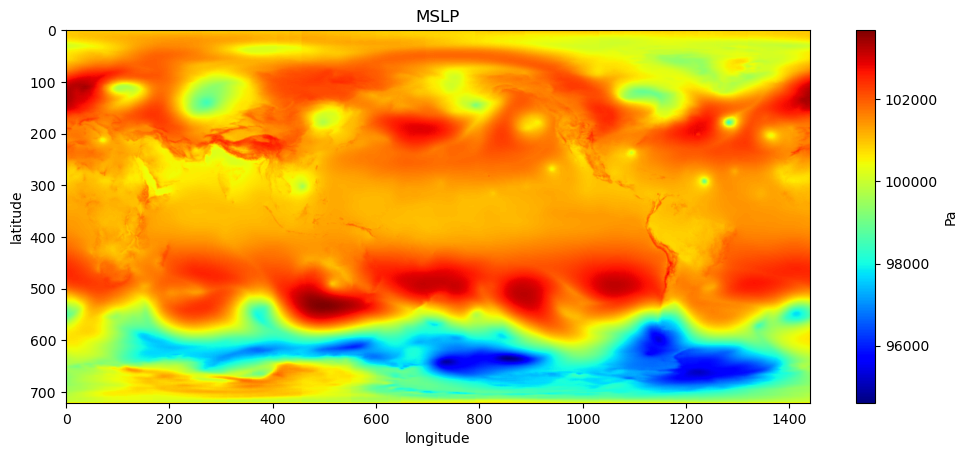

In [43]:
plot_surface("output_data/output_surface_16_09_2020_00.npy")

In [49]:
i2date("15/9/2020 12:00",26)

step 26 = 2020-09-22 00:00:00 UTC


--- 0.20374560356140137 seconds ---


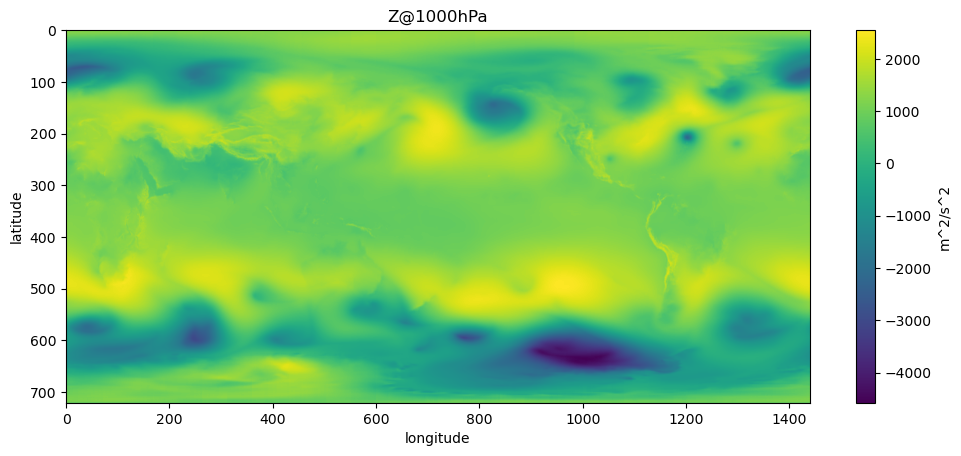

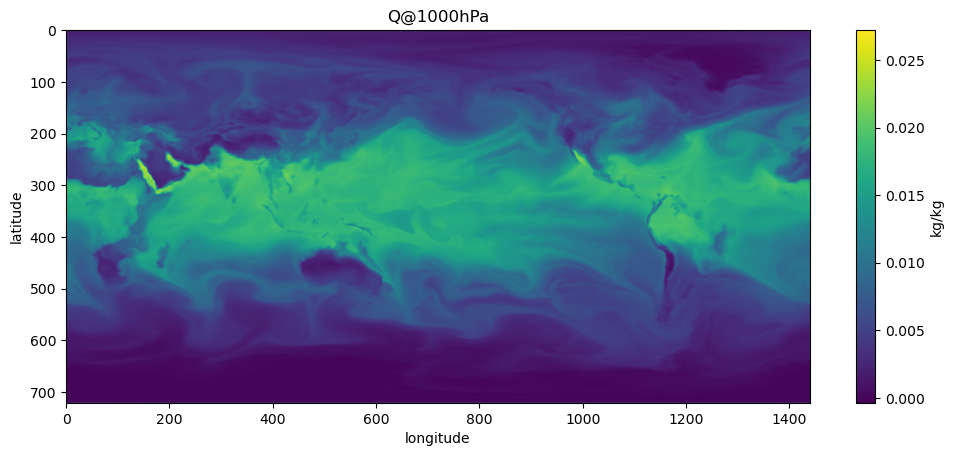

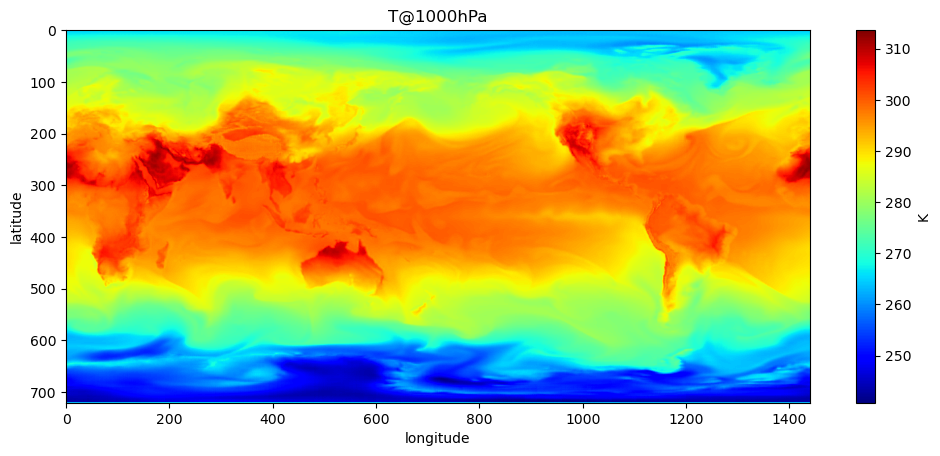

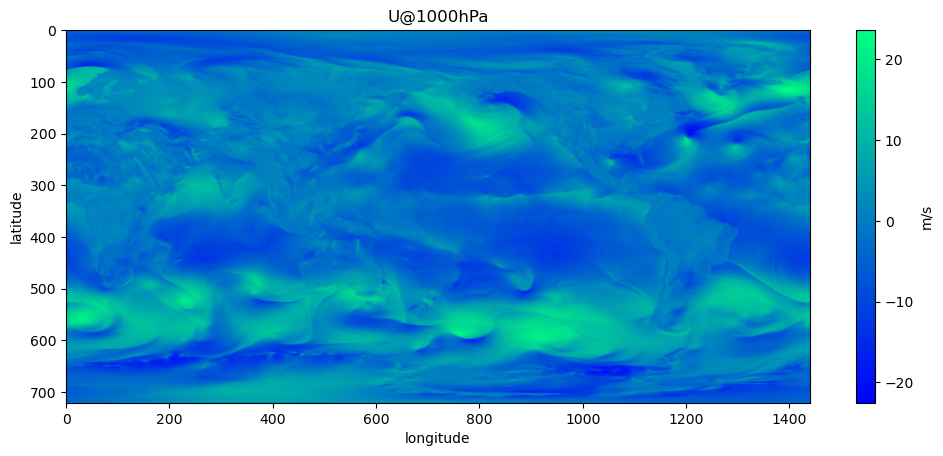

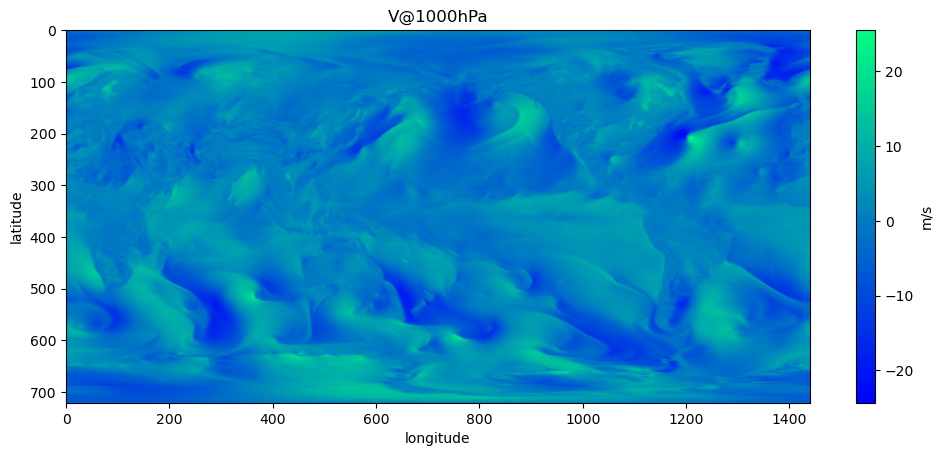

In [24]:
plot_upper("output_data/output_upper_15_09_2020_12_step_26.npy",0)

In [39]:
import time
start_time = time.time()

for i in range(800000000):
    j=i+1

print("--- %s minutes ---" % ((time.time() - start_time)/60))
print("--- %s seconds ---" % (time.time() - start_time))

--- 1.2204830567042033 minutes ---
--- 73.22915124893188 seconds ---


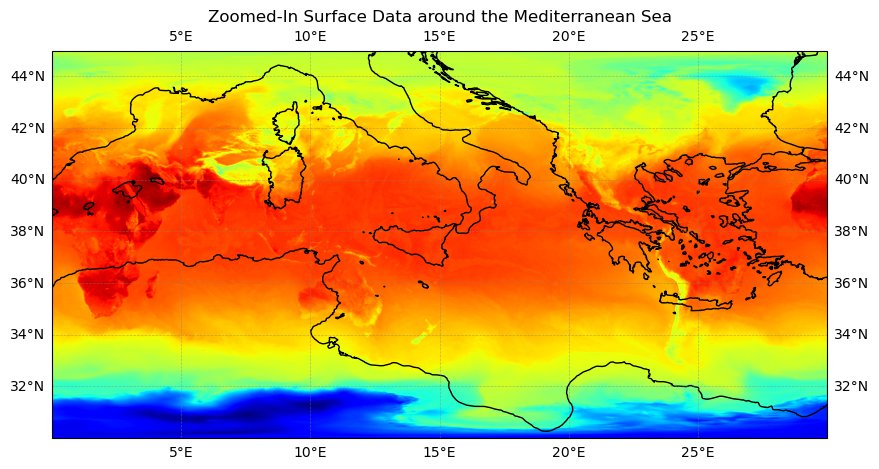

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Load your data
data_in_surface = np.load("/work3/zizzi/soclimpact_medcordex/Pangu-Weather/input_data/input_surface.npy")

# Extract the latitude and longitude values
latitudes = np.arange(-90, 90, 0.25)
longitudes = np.arange(0, 360, 0.25)

# Specify the desired latitude and longitude values for the grid
grid_latitudes = np.arange(0, 61, 30)
grid_longitudes = np.arange(0, 241, 60)

# Define the region you want to zoom in on (Mediterranean Sea)
extent = [0, 30, 30, 45]  # [lon_min, lon_max, lat_min, lat_max]

# Create a figure and axes using Cartopy
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree(central_longitude=0))

# Plot the data using imshow(), specifying the extent
ax.imshow(data_in_surface[3, :, :], origin='upper', extent=extent, cmap='jet')

# Add gridlines and labels to the plot
ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')

# Add continent contours to the plot
ax.add_feature(cfeature.COASTLINE)

# Set appropriate axis labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Zoomed-In Surface Data around the Mediterranean Sea')

# Display the plot
plt.show()
